# Required Libraries

In [19]:
import numpy as np                            
import astropy.units as u                     
import matplotlib.pyplot as plt               
import sunpy.map                               
from astropy.coordinates import SkyCoord       
from skimage.measure import label, regionprops 
from sunpy.net import Fido                     
from sunpy.net import attrs as a              
from aiapy.calibrate import register          
import pandas as pd                            
from matplotlib.colors import Normalize 
plt.ion()                                     

In [20]:
AIA_DATA=Fido.search(a.Time('2016/03/02 11:44:33','2016/03/02 11:44:43'),a.Instrument.aia, a.Wavelength(193*u.angstrom),a.Physobs.intensity)
AIA_Data=Fido.fetch(AIA_DATA)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

In [21]:
HMI_DATA=Fido.search(a.Time('2016/03/06 21:44:01','2016/03/06 21:44:53'),a.Instrument.hmi, a.Physobs.los_magnetic_field)
HMI_Data=Fido.fetch(HMI_DATA)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

In [22]:
aia193 = sunpy.map.Map(AIA_Data)
hmi6173 = sunpy.map.Map(HMI_Data[0])

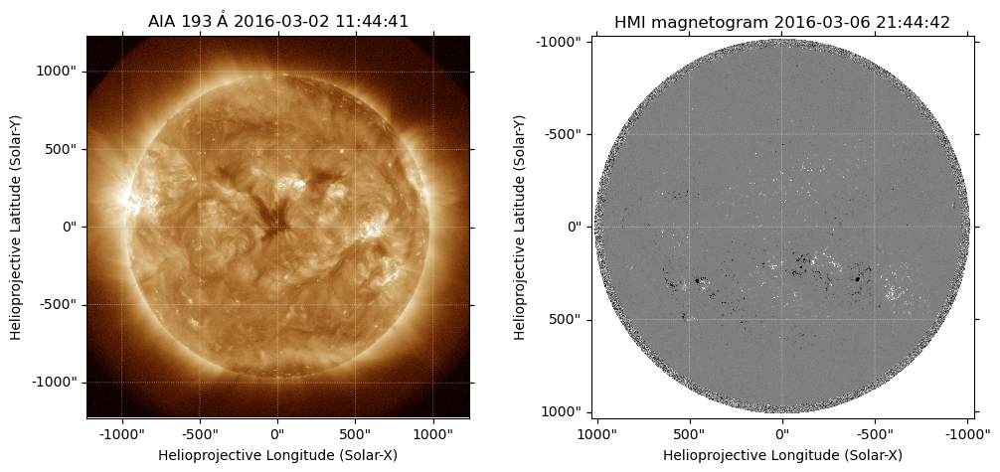

In [23]:
fig = plt.figure(figsize=(12, 5))
ax1 = fig.add_subplot(121, projection=aia193)
aia193.plot(axes=ax1, clip_interval=(1, 99.9)*u.percent)
ax2 = fig.add_subplot(122, projection=hmi6173)
hmi6173.plot(axes=ax2,norm=plt.Normalize(-500, 500))

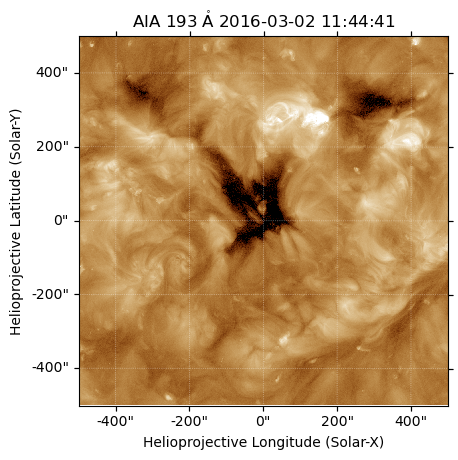

In [24]:
blc1 = SkyCoord(Tx=-500*u.arcsec, Ty=-500*u.arcsec, frame=aia193.coordinate_frame)
trc1 = SkyCoord(Tx=500*u.arcsec, Ty=500*u.arcsec, frame=aia193.coordinate_frame)
aia_sub = aia193.submap(blc1,top_right=trc1)
aia_sub.plot(clip_interval=(1, 99.9)*u.percent)

In [25]:
aia_sub.data.shape

(1667, 1667)

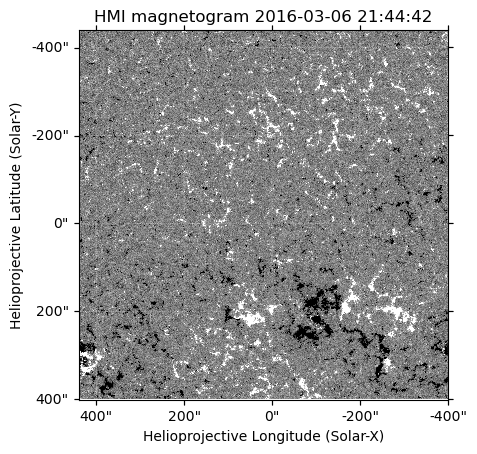

In [36]:
blc2 = SkyCoord(Tx=-400*u.arcsec, Ty=-439.3*u.arcsec, frame=hmi6173.coordinate_frame)
trc2 = SkyCoord(Tx=439*u.arcsec, Ty=400*u.arcsec, frame=hmi6173.coordinate_frame)
hmi_sub = hmi6173.submap(blc2,top_right=trc2)
hmi_sub.plot(norm=plt.Normalize(-50, 50))

In [37]:
hmi_sub.data.shape

(1667, 1667)

In [38]:
from scipy.ndimage import gaussian_filter
# ── Segment AIA dark regions and smooth mask ──
segmented = aia_sub.data < 100
smoothed_mask = gaussian_filter(segmented.astype(float), sigma=2) > 0.5

# Label regions and sort
labeled = label(smoothed_mask)
regions = regionprops(labeled, intensity_image=hmi_sub.data)
regions = sorted(regions, key=lambda r: r.area, reverse=True)

In [39]:
# Create mask from largest region
bbox = regions[0].bbox
mask = np.ones_like(hmi_sub.data, dtype=bool)
mask[bbox[0]: bbox[2], bbox[1]: bbox[3]] = ~regions[0].image

# Create masked SunPy map
hmi_masked = sunpy.map.Map((hmi_sub.data, hmi_sub.meta), mask=mask)

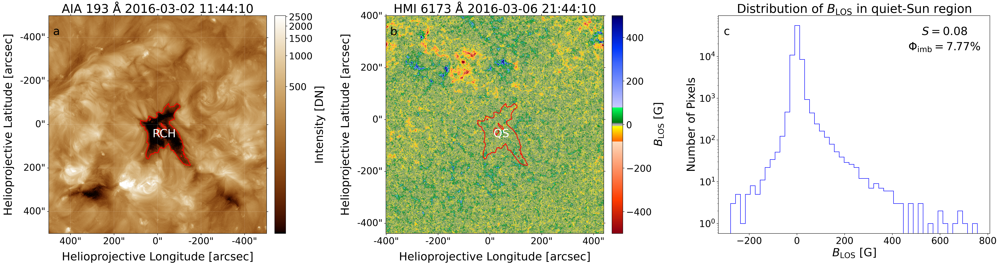

In [40]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.ndimage import gaussian_filter
from skimage.measure import label, regionprops
import astropy.units as u

# ── Segment AIA dark regions and smooth mask ──
segmented = aia_sub.data < 100
smoothed_mask = gaussian_filter(segmented.astype(float), sigma=2) > 0.5

# Label regions and sort
labeled = label(smoothed_mask)
regions = regionprops(labeled, intensity_image=hmi_sub.data)
regions = sorted(regions, key=lambda r: r.area, reverse=True)

# Largest region
largest_region = regions[0]
single_mask = labeled == largest_region.label

# ── Create figure ──
fig = plt.figure(figsize=(30, 8), dpi=300)

# ── AIA subplot ──
ax1 = fig.add_subplot(1, 3, 1, projection=aia_sub.wcs)
im1 = aia_sub.plot(axes=ax1, clip_interval=(1, 99.9) * u.percent)
ax1.contour(single_mask, levels=[0.5], colors="red")

y, x = largest_region.centroid
ax1.text(x, y, "RCH", color="white",
         ha="center", va="center", fontsize=24)

ax1.set_title("AIA 193 Å 2016-03-02 11:44:10", fontsize=26)
ax1.coords[0].set_axislabel("Helioprojective Longitude [arcsec]", fontsize=24)
ax1.coords[1].set_axislabel("Helioprojective Latitude [arcsec]", fontsize=24)
ax1.tick_params(labelsize=20)

cbar1 = plt.colorbar(im1, ax=ax1, orientation='vertical', pad=0.03)
cbar1.set_label("Intensity [DN]", fontsize=24)
cbar1.ax.tick_params(labelsize=20)

ax1.invert_xaxis()
ax1.invert_yaxis()
ax1.text(0.02, 0.95, "a",
         transform=ax1.transAxes, va="top", ha="left", fontsize=24)

# ── HMI subplot ──
ax2 = fig.add_subplot(1, 3, 2, projection=hmi_sub.wcs)
im2 = hmi_sub.plot(axes=ax2, cmap="hmimag", norm=Normalize(-500, 500))
ax2.contour(single_mask, levels=[0.5], colors="red")

ax2.set_title("HMI 6173 Å 2016-03-06 21:44:10", fontsize=26)
ax2.coords[0].set_axislabel("Helioprojective Longitude [arcsec]", fontsize=24)
ax2.coords[1].set_axislabel("Helioprojective Latitude [arcsec]", fontsize=24)
ax2.tick_params(labelsize=20)

ax2.text(x, y, "QS", color="white",
         ha="center", va="center", fontsize=24)

cbar2 = plt.colorbar(im2, ax=ax2, orientation='vertical', pad=0.03)
cbar2.set_label(r"$B_{\mathrm{LOS}}$ [G]", fontsize=24)
cbar2.ax.tick_params(labelsize=20)

ax2.invert_xaxis()
ax2.invert_yaxis()
ax2.text(0.02, 0.95, "b",
         transform=ax2.transAxes, va="top", ha="left", fontsize=24)

# ── Histogram subplot ──
ax3 = fig.add_subplot(1, 3, 3)
unmasked_data = hmi_masked.data[~hmi_masked.mask]
ax3.hist(unmasked_data, bins=50, histtype="step", color="blue")
ax3.set_yscale("log")

ax3.set_xlabel(r"$B_{\mathrm{LOS}}$ [G]", fontsize=24)
ax3.set_ylabel("Number of Pixels", fontsize=24)
ax3.set_title(r"Distribution of $B_{\mathrm{LOS}}$ in quiet-Sun region",
              fontsize=26)
ax3.tick_params(labelsize=20)

ax3.text(0.75, 0.95, r"$S = 0.08$",
         transform=ax3.transAxes, va="top", fontsize=24)
ax3.text(0.70, 0.88, r"$\Phi_{\mathrm{imb}} = 7.77\%$",
         transform=ax3.transAxes, va="top", fontsize=24)

ax3.text(0.02, 0.95, "c",
         transform=ax3.transAxes, va="top", ha="left", fontsize=24)

# ── Final layout ──
plt.tight_layout(pad=1.0)
plt.savefig("/Users/khagendrakatwal/Desktop/Quiet_SUN_combined.pdf",
            format="pdf", bbox_inches="tight")
plt.show()

### Skewness of Magnetic Field Distribution
$$
\text{Skewness} = \frac{3(\mu - M)}{\sigma}
$$
**Where:**

- $\mu$ = Mean of the magnetic field values  
- $M$ = Median of the magnetic field values  
- $\sigma$ = Standard deviation of the magnetic field values

In [49]:
def Skewness(region_map):
    mean = np.nanmean(region_map)
    median = np.nanmedian(region_map)
    std = np.nanstd(region_map)
    skewness = 3 * (mean - median) / std
    return skewness
# Extract unmasked magnetic field values from the masked HMI map
magnetic_field_values = hmi_masked.data[~hmi_masked.mask]
# Calculate the skewness of the largest region
skewness = Skewness(magnetic_field_values)

### Magnetic Flux Imbalance
$$
\text{Flux Imbalance}~(\%) = 
\left( 
\frac{
\left| \sum\limits_{i=1}^{N} B_i^+ - \sum\limits_{i=1}^{N} B_i^- \right|
}{
\left| \sum\limits_{i=1}^{N} B_i^+ \right| + \left| \sum\limits_{i=1}^{N} B_i^- \right|
}
\right) \times 100\%
$$

Where:

$B_i^+$ = Positive (outward) magnetic field values  
$B_i^-$ = Negative (inward) magnetic field values  
$N$ = Total number of pixels  


## SOURCE

We use the magnetic flux imbalance formula as described in:
- Wiegelmann & Solanki (2004)
- Abramenko et al. (2009)
- Hofmeister et al. (2017)

These works establish that coronal holes exhibit significant unipolarity, quantified by comparing net and total magnetic fluxes.

In [52]:
def calculate_flux_imbalance(data):
    """
    Calculate the flux imbalance and flux percentages based on magnetic field data.

    Parameters:
        data (numpy.ndarray): Array containing magnetic field data.

    Returns:
        tuple: Flux imbalance percentage, positive flux percentage, negative flux percentage.
    """
    positive_data = data[data > 0]
    negative_data = data[data < 0]

    total_positive_flux = np.sum(positive_data)
    total_negative_flux = np.sum(np.abs(negative_data))  # Take absolute value of negative data
    
    total_flux = total_positive_flux + total_negative_flux
    flux_imbalance_percentage = (abs(total_positive_flux - total_negative_flux) / total_flux) * 100
    
    positive_flux_percentage = (total_positive_flux / total_flux) * 100
    negative_flux_percentage = (total_negative_flux / total_flux) * 100
    
    return flux_imbalance_percentage, positive_flux_percentage, negative_flux_percentage

# hmi_masked.data[~hmi_masked.mask] contains the magnetic field data
data = magnetic_field_values

imbalance_flux_percentage, positive_flux_percentage, negative_flux_percentage = calculate_flux_imbalance(data)